In [1]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from scipy.stats import mode
from scipy.signal import convolve2d
%matplotlib inline

In [2]:
data = pd.read_csv("./train2.csv")

In [3]:
data.columns

Index(['id', 'date', 'sum'], dtype='object')

In [4]:
data.shape

(12701823, 3)

In [5]:
data.sort_values(['id', 'date'], inplace=True)

In [6]:
data.to_csv("./sorted.csv", index=False)

In [7]:
arr = data.values

In [8]:
ids = np.unique(arr[:,0])
last_day = np.max(arr[:,1])
sums = np.unique(arr[:,2])

In [9]:
t = arr[:,0]
ind = np.concatenate([np.array([0,]),np.where(np.diff(t))[0]+1,np.array(t.shape)])
ind

array([       0,      202,      325, ..., 12701686, 12701762, 12701823], dtype=int64)

In [10]:
clients = {t[ind[i]] : arr[ind[i]:ind[i+1], 1:] for i in range(ind.size-1)}

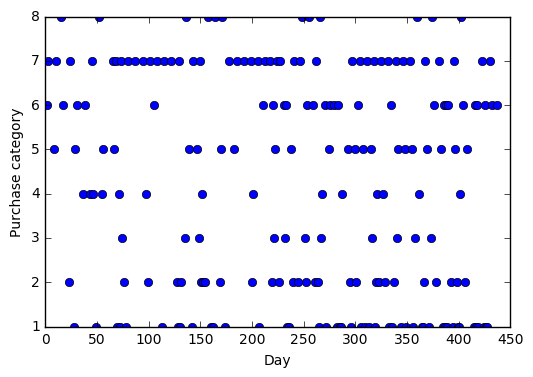

In [11]:
ttt = plt.plot(clients[1][:,0], clients[1][:,1], "bo")
plt.xlabel("Day")
plt.ylabel("Purchase category")
plt.show()

In [20]:
np.min(arr[:,1]), np.max(arr[:,1])

(1, 438)

In [15]:
subs = np.random.randint(1,110001, (20,))

In [16]:
ids.shape

(110000,)

In [17]:
ids

array([     1,      2,      3, ..., 109998, 109999, 110000], dtype=int64)

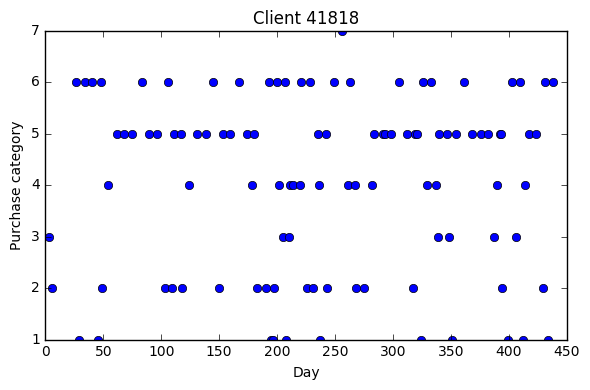

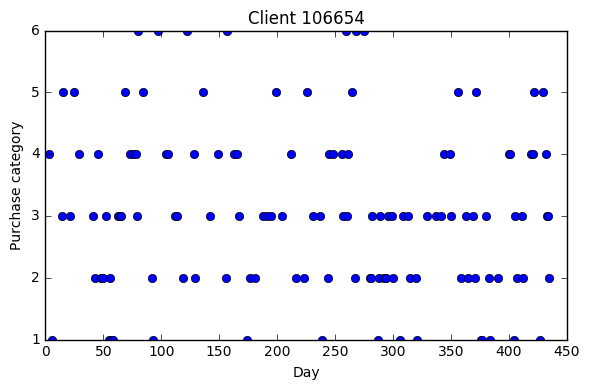

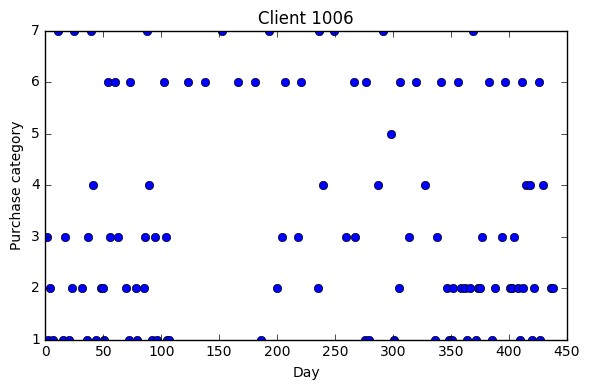

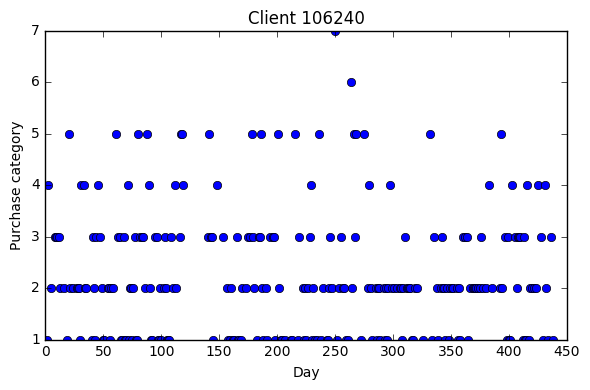

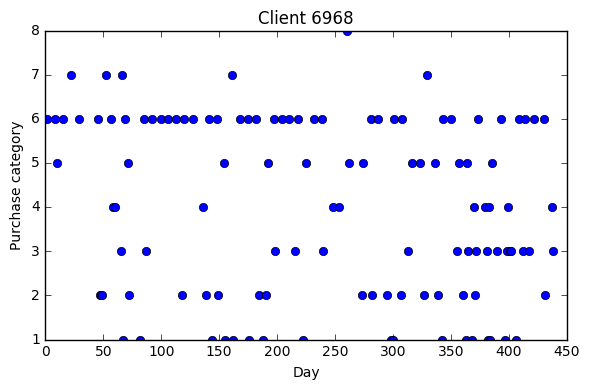

...

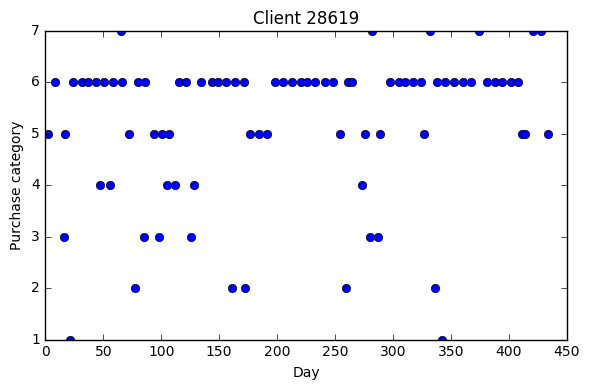

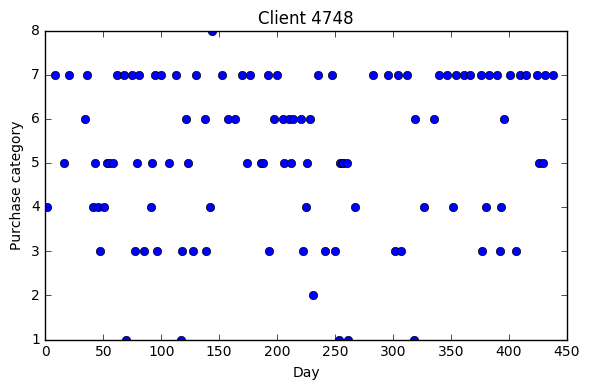

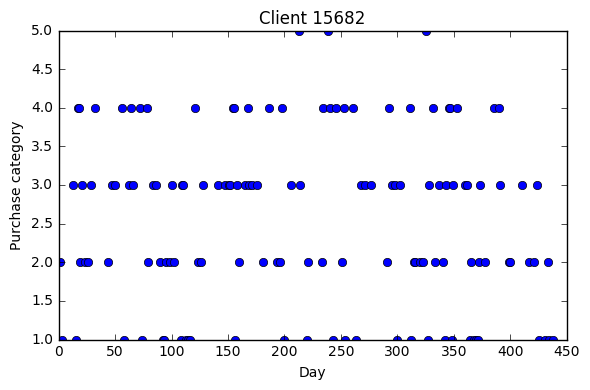

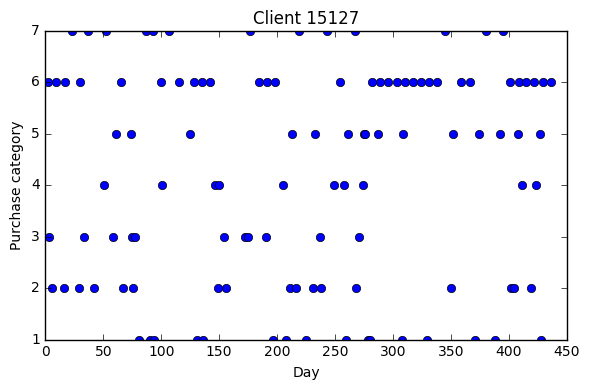

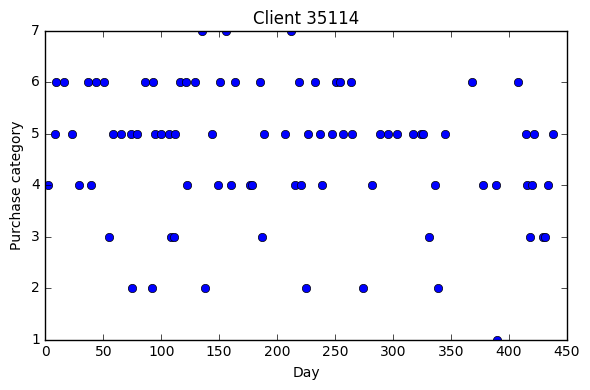

In [23]:
for i in subs:
    plt.plot(clients[i][:,0], clients[i][:,1], "bo")
    plt.xlabel("Day")
    plt.ylabel("Purchase category")
    plt.title("Client "+str(i))
    plt.tight_layout()
    plt.savefig("./pic/"+str(i)+".png")
    plt.show()

In [93]:
def mov_mode(x, kernel=7):
    return np.array([mode(x[i:i+kernel][x[i:i+kernel]>0])[0][0] for i in range(x.size-kernel)])

In [94]:
mov_mode(np.array([0,1,1,0,0,3,1,0,1,5,1,1,4,1,4,4,4,7,4]))

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 4, 4])

In [74]:
expanded = {i:np.zeros((last_day,), dtype=int) for i in ids}

In [76]:
for i in ids:
    expanded[i][clients[i][:,0]-1] = clients[i][:,1]

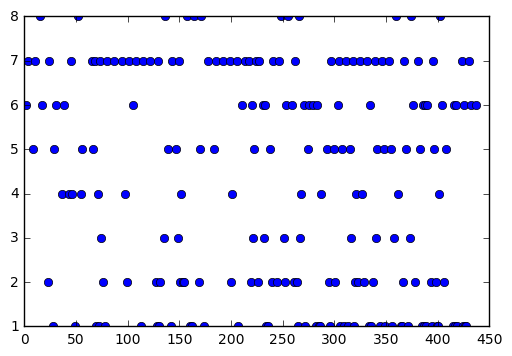

In [78]:
plt.plot(clients[1][:,0], clients[1][:,1], "bo")
plt.show()

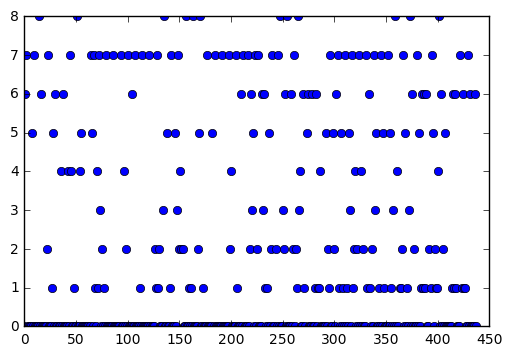

In [80]:
plt.plot(expanded[1], "bo")

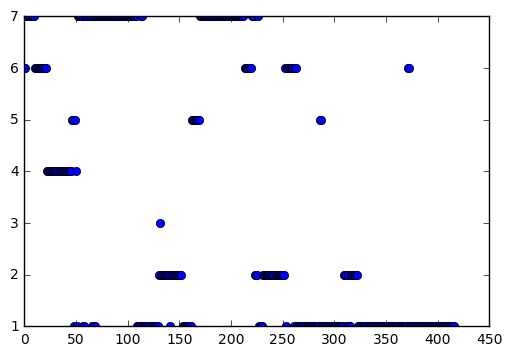

In [96]:
plt.plot(mov_mode(expanded[1], 21), "bo")

## Сглаженная мода

In [159]:
weights = np.exp((np.arange(last_day)-last_day)/20.0)
weights/=np.sum(weights)

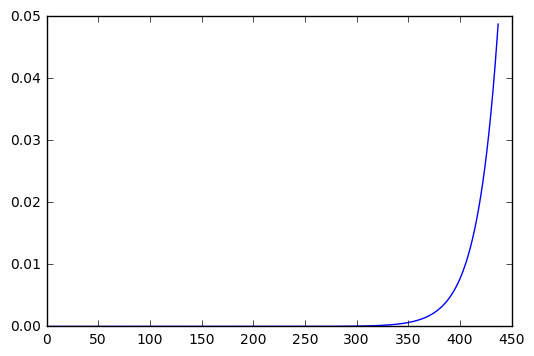

In [153]:
plt.plot(weights)

In [154]:
def weight_mode(x, w):
    return np.array([np.sum(w[x==i]) for i in range(17)])

In [155]:
res = np.array([exp_mode(expanded[i], weights) for i in ids])
res[:,0] /= 7
res = np.argmax(res, axis=1)

In [156]:
res = np.hstack([np.arange(1,res.size+1)[:,None], res[:,None]])

In [157]:
resdf = pd.DataFrame(data=res, index=res[:,0], columns=['id','sum'])

In [151]:
resdf.to_csv("./weighted_mode2.csv", index=False)

## Same without zeros

In [162]:
res = np.array([exp_mode(expanded[i], weights) for i in ids])
res = res[:,1:]
res = np.argmax(res, axis=1)+1

In [163]:
res = np.hstack([np.arange(1,res.size+1)[:,None], res[:,None]])
resdf = pd.DataFrame(data=res, index=res[:,0], columns=['id','sum'])
resdf.to_csv("./weighted_mode_no0.csv", index=False)

## Same with different zero coefficient

In [172]:
res = np.array([exp_mode(expanded[i], weights) for i in ids])
res[:,0] /= 21
res = np.argmax(res, axis=1)

In [173]:
res = np.hstack([np.arange(1,res.size+1)[:,None], res[:,None]])
resdf = pd.DataFrame(data=res, index=res[:,0], columns=['id','sum'])
resdf.to_csv("./weighted_mode_z21.csv", index=False)

### Adjust params

In [188]:
alldata = np.array([expanded[i] for i in ids])
N = alldata.shape[0]
D = alldata.shape[1]

In [189]:
train = alldata[:,:last_day-7] 
rest = alldata[:,last_day-7:]
Dt = train.shape[1]

In [192]:
gnd = []
for i in range(N):
    t = np.where(rest[i]>0)[0]
    if (len(t)==0):
        gnd.append(0)
    else:
        gnd.append(rest[i, t[0]])
gnd = np.array(gnd)

In [198]:
def weighted_mode_z(x, scale=20.0, zw=14.0):
    weights = np.exp((np.arange(x.shape[1])-x.shape[1])/float(scale))
    weights/=np.sum(weights)
    res = np.array([exp_mode(x[i], weights) for i in range(x.shape[0])])
    res[:,0] /= float(zw)
    return np.argmax(res, axis=1)

In [199]:
res = weighted_mode_z(train)

In [202]:
np.sum(res==gnd)/gnd.size

0.35826363636363634

In [205]:
scores = []
params = []
for scale in [20, 30, 40, 50, 60, 70, 80, 100]:
    for zw in [10, 12, 14, 16, 18, 20, 22]:
        res = weighted_mode_z(train, scale, zw)
        sc = np.sum(res==gnd)/gnd.size
        print(scale, zw, sc)
        scores.append(sc)
        params.append((scale, zw))

20 10 0.353181818182
20 12 0.359254545455
20 14 0.358263636364
20 16 0.355854545455
20 18 0.351972727273
20 20 0.347254545455
20 22 0.343063636364
30 10 0.359245454545
30 12 0.370218181818
30 14 0.371236363636
30 16 0.368727272727
30 18 0.365645454545
30 20 0.361409090909
30 22 0.357845454545
40 10 0.361236363636
40 12 0.374372727273
40 14 0.377027272727
40 16 0.375345454545
40 18 0.371209090909
40 20 0.366536363636
40 22 0.361236363636
50 10 0.360954545455
50 12 0.375009090909
50 14 0.378663636364
50 16 0.376827272727
50 18 0.371727272727
50 20 0.365509090909
50 22 0.359472727273
60 10 0.358772727273
60 12 0.373436363636
60 14 0.376936363636
60 16 0.375181818182
60 18 0.369
60 20 0.3614
60 22 0.353190909091
70 10 0.356436363636
70 12 0.371372727273
70 14 0.374681818182
70 16 0.371727272727
70 18 0.364818181818
70 20 0.355554545455
70 22 0.345881818182
80 10 0.354145454545
80 12 0.368618181818
80 14 0.371354545455
80 16 0.367754545455
80 18 0.359781818182
80 20 0.349845454545
80 22 0.3

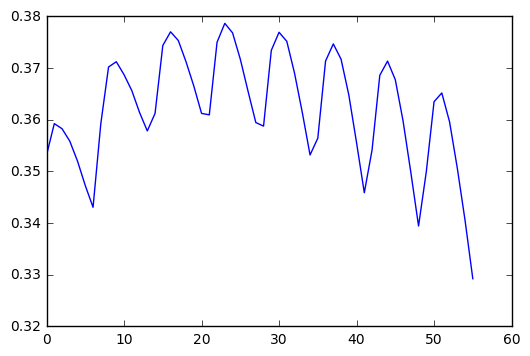

In [206]:
plt.plot(scores)

In [208]:
t = np.argmax(np.array(scores))
params[t]

(50, 14)

In [209]:
res = weighted_mode_z(alldata, 50, 14)

In [211]:
res = np.hstack([(np.arange(N)+1)[:,None], res[:,None]])
resdf = pd.DataFrame(data=res, index=res[:,0], columns=['id','sum'])
resdf.to_csv("./weighted_mode_fit.csv", index=False)

### Zero subtask

In [216]:
def find_score(x, y):
    return np.sum(x==y)/y.size
    
def zero_score(x, y):
    return np.sum(x.astype(bool)==y.astype(bool))/y.size

In [214]:
res = weighted_mode_z(train, 50, 14)

In [217]:
zero_score(res, gnd)

0.80146363636363638

In [252]:
def visit_prob(x, size=7):
    weights = np.arange(size, dtype=float)
    weights /= np.sum(weights)
    print (weights)
    return np.array([[np.sum(weights*(t>0)[i:i+size]) for i in range(x.shape[1]-size)] for t in x])

In [253]:
res = visit_prob(alldata[:1, :], 100)

[ 0.          0.00020202  0.00040404  0.00060606  0.00080808  0.0010101
  0.00121212  0.00141414  0.00161616  0.00181818  0.0020202   0.00222222
  0.00242424  0.00262626  0.00282828  0.0030303   0.00323232  0.00343434
  0.00363636  0.00383838  0.0040404   0.00424242  0.00444444  0.00464646
  0.00484848  0.00505051  0.00525253  0.00545455  0.00565657  0.00585859
  0.00606061  0.00626263  0.00646465  0.00666667  0.00686869  0.00707071
  0.00727273  0.00747475  0.00767677  0.00787879  0.00808081  0.00828283
  0.00848485  0.00868687  0.00888889  0.00909091  0.00929293  0.00949495
  0.00969697  0.00989899  0.01010101  0.01030303  0.01050505  0.01070707
  0.01090909  0.01111111  0.01131313  0.01151515  0.01171717  0.01191919
  0.01212121  0.01232323  0.01252525  0.01272727  0.01292929  0.01313131
  0.01333333  0.01353535  0.01373737  0.01393939  0.01414141  0.01434343
  0.01454545  0.01474747  0.01494949  0.01515152  0.01535354  0.01555556
  0.01575758  0.0159596   0.01616162  0.01636364  0.

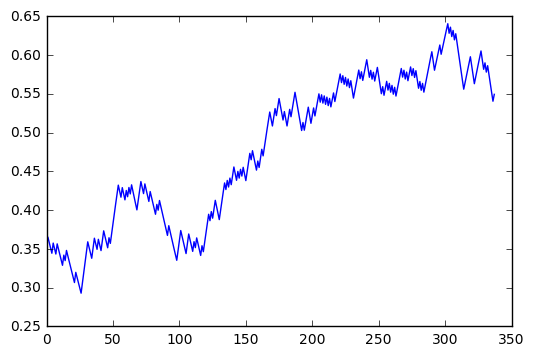

In [254]:
plt.plot(res[0])

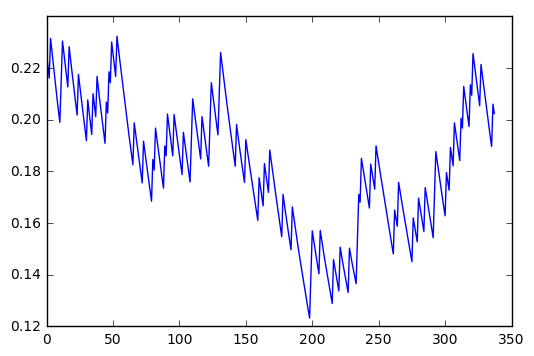

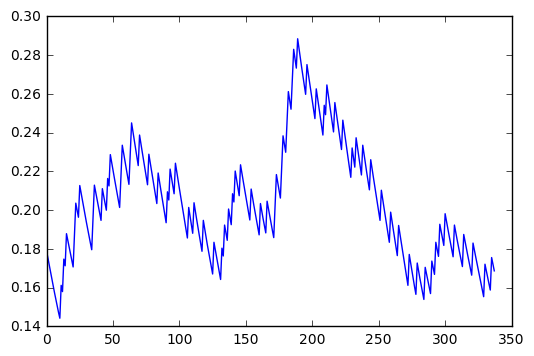

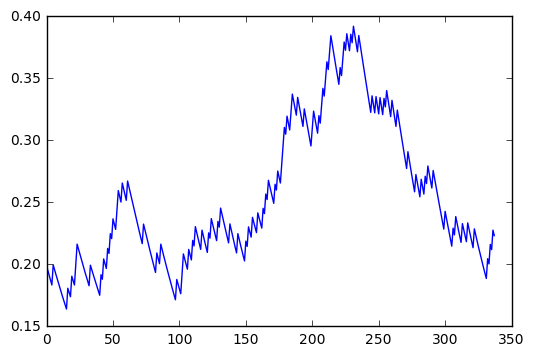

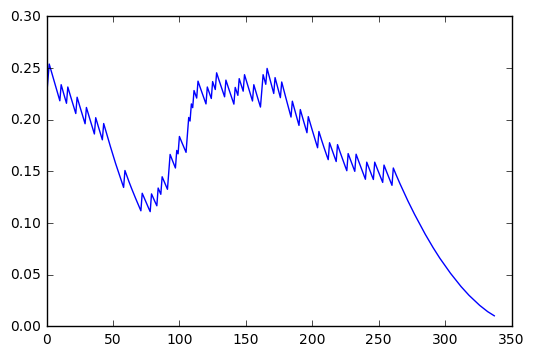

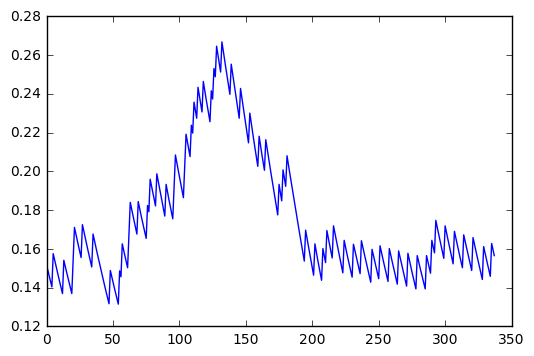

...

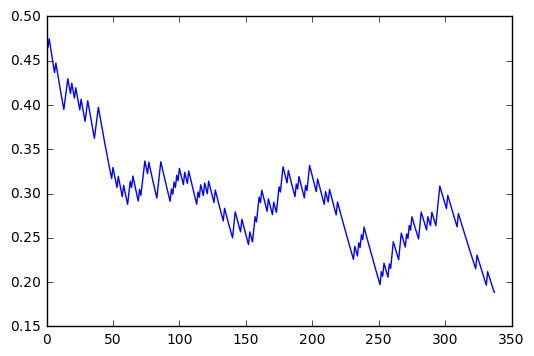

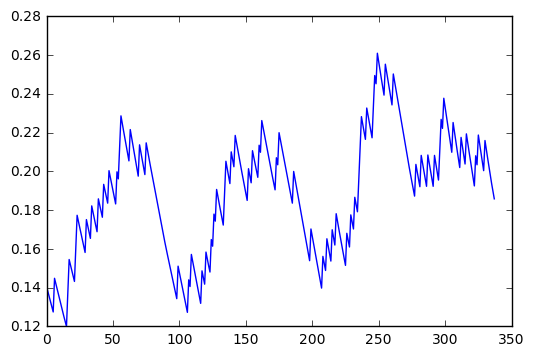

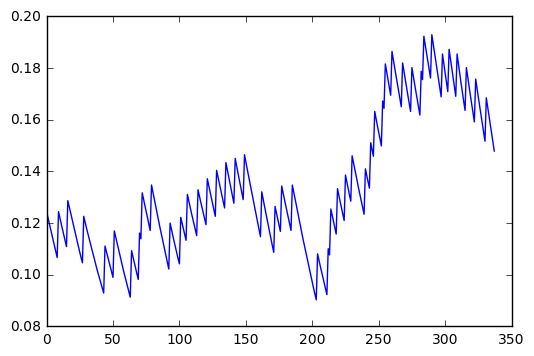

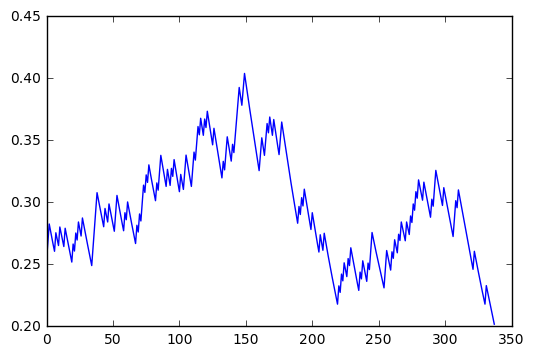

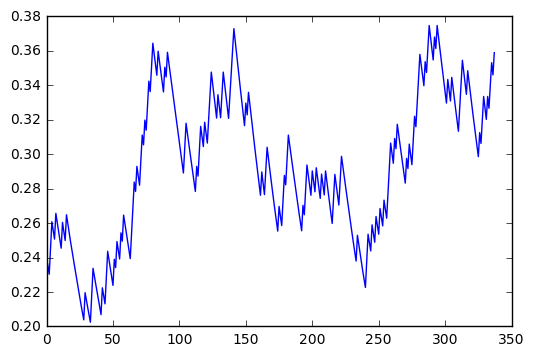

In [251]:
tt = visit_prob(alldata[subs, :], 100)
for i in range(tt.shape[0]):
    plt.plot(tt[i])
    plt.savefig("./visits/"+str(i)+".png")
    plt.show()

In [281]:
def calc_visits(x, thresh):
    #res = np.array([[np.any(t[i:i+7]) for i in range(x.shape[1]-7)] for t in x]).astype(float)
    res = (convolve2d(x, np.array([[1,1,1,1,1,1,1]]), 'valid') > 0).astype(float)
    weights = np.arange(res.shape[1]).astype(float)
    weights /= np.sum(weights)
    res = np.sum(res * weights[None,:], axis=1)
    return (res>thresh).astype(int)

In [282]:
res = calc_visits(train, 0.5)
zero_score(res, gnd)

0.78919090909090905

In [286]:
for thresh in [0.72,0.73, 0.74, 0.75, 0.76]:
    res = calc_visits(train, thresh)
    print (thresh, zero_score(res, gnd))

0.72 0.8262
0.73 0.831254545455
0.74 0.8361
0.75 0.831654545455
0.76 0.826890909091


In [289]:
def nonzero_mode(x, scale=50):
    weights = np.exp((np.arange(x.shape[1])-x.shape[1])/float(scale))
    weights/=np.sum(weights)
    res = np.array([weight_mode(x[i], weights) for i in range(x.shape[0])])
    res = res[:,1:]
    return np.argmax(res, axis=1)+1

In [320]:
res = nonzero_mode(train, 50)
t = calc_visits(train, 0.75)
res[t==0] = 0

In [321]:
find_score(res, gnd)

0.38115454545454547

In [322]:
zero_score(res, gnd)

0.83165454545454542

In [311]:
res = nonzero_mode(alldata, 50)
t = calc_visits(alldata, 0.75)
res[t==0] = 0

In [296]:
def submit(x, name):
    res = np.hstack([(np.arange(x.size)+1)[:,None], x[:,None]])
    resdf = pd.DataFrame(data=res, index=res[:,0], columns=['id','sum'])
    resdf.to_csv(name, index=False)

In [297]:
submit(res, "./7days.csv")

### zeros separately by exponential weight

In [298]:
def calc_visits_exp(x, thresh, scale):
    res = (convolve2d(x, np.array([[1,1,1,1,1,1,1]]), 'valid') > 0).astype(float)
    weights = np.exp((np.arange(res.shape[1])-res.shape[1])/float(scale))
    weights /= np.sum(weights)
    res = np.sum(res * weights[None,:], axis=1)
    return (res>thresh).astype(int)

In [305]:
scores = []
params = []
for scale in [5,10,20,30,40,50,60,70,80]:
    for thresh in [0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,0.5,0.55,0.6,0.65,0.7,0.75,0.8,0.85]:
        res = calc_visits_exp(train, thresh, scale)
        sc = zero_score(res, gnd)
        scores.append(sc)
        params.append((scale, thresh))
        print(scale,thresh,sc)
        

5 0.1 0.8686
5 0.15 0.866954545455
5 0.2 0.865718181818
5 0.25 0.8621
5 0.3 0.860190909091
5 0.35 0.857545454545
5 0.4 0.852718181818
5 0.45 0.845918181818
5 0.5 0.8429
5 0.55 0.831645454545
5 0.6 0.8283
5 0.65 0.823536363636
5 0.7 0.8115
5 0.75 0.804763636364
5 0.8 0.7929
5 0.85 0.776854545455
10 0.1 0.868909090909
10 0.15 0.869254545455
10 0.2 0.869345454545
10 0.25 0.869118181818
10 0.3 0.868381818182
10 0.35 0.867336363636
10 0.4 0.865827272727
10 0.45 0.862372727273
10 0.5 0.857827272727
10 0.55 0.851336363636
10 0.6 0.844872727273
10 0.65 0.835618181818
10 0.7 0.823609090909
10 0.75 0.807490909091
10 0.8 0.790481818182
10 0.85 0.765327272727
20 0.1 0.866027272727
20 0.15 0.867590909091
20 0.2 0.868563636364
20 0.25 0.869372727273
20 0.3 0.870354545455
20 0.35 0.870827272727
20 0.4 0.870681818182
20 0.45 0.869863636364
20 0.5 0.867518181818
20 0.55 0.863827272727
20 0.6 0.858081818182
20 0.65 0.8486
20 0.7 0.836290909091
20 0.75 0.818254545455
20 0.8 0.794545454545
20 0.85 0.76097

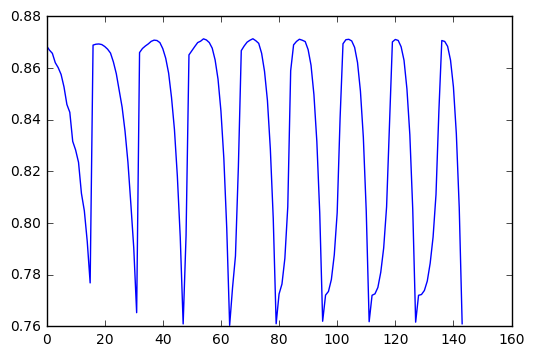

In [306]:
plt.plot(scores)

In [307]:
t = np.argmax(np.array(scores))

In [309]:
params[t]

(40, 0.45)

In [339]:
vis = calc_visits_exp(train, 0.35, 20)
for scale in [5,10,20,30,40,50]:
    res = nonzero_mode(train, scale)
    res[vis==0] = 0
    sc = find_score(res, gnd)
    print(scale, sc)

5 0.296590909091
10 0.312718181818
20 0.335054545455
30 0.346490909091
40 0.352718181818
50 0.357090909091


In [327]:
res = nonzero_mode(train, 50)
t = calc_visits_exp(train, 0.45, 40)
tt = calc_visits(train, 0.75)
res1 = res.copy()
res1[t==0] = 0
res2 = res.copy()
res2[tt==0] = 0

In [329]:
find_score(res1, gnd), find_score(res2, gnd)

(0.35994545454545457, 0.38115454545454547)

In [330]:
zero_score(res1,gnd), zero_score(res2, gnd)

(0.87136363636363634, 0.83165454545454542)

In [332]:
zero_score(res1,res2)

0.85919999999999996

In [333]:
res1[:100]

array([1, 4, 0, 5, 2, 4, 1, 5, 3, 0, 5, 6, 5, 5, 5, 1, 0, 6, 2, 2, 0, 3, 0,
       6, 4, 0, 1, 5, 5, 4, 4, 0, 5, 5, 0, 0, 5, 3, 5, 0, 4, 1, 0, 5, 5, 5,
       6, 4, 2, 2, 5, 8, 6, 1, 6, 4, 6, 5, 5, 6, 5, 1, 8, 2, 2, 5, 4, 5, 0,
       6, 2, 0, 5, 1, 1, 5, 3, 1, 5, 5, 4, 6, 3, 5, 3, 0, 5, 3, 5, 6, 5, 2,
       0, 6, 2, 4, 6, 4, 5, 4], dtype=int64)

In [334]:
res2[:100]

array([1, 4, 0, 5, 2, 4, 1, 5, 3, 0, 5, 6, 5, 5, 5, 1, 0, 6, 2, 2, 0, 3, 0,
       6, 4, 0, 1, 5, 5, 4, 4, 0, 5, 5, 0, 0, 5, 3, 0, 6, 4, 0, 0, 5, 5, 0,
       0, 0, 2, 0, 5, 0, 6, 1, 6, 4, 6, 5, 5, 6, 5, 1, 8, 2, 2, 5, 4, 5, 0,
       0, 2, 0, 5, 0, 1, 5, 3, 1, 5, 5, 4, 6, 3, 0, 3, 0, 5, 3, 5, 6, 0, 2,
       0, 6, 2, 4, 6, 4, 5, 4], dtype=int64)

In [335]:
np.sum(res1>0),np.sum(res2>0)

(95654, 80444)

In [336]:
np.sum(gnd>0)/gnd.size

0.77205454545454544

### adjust params for zeros with linear weight

In [346]:
scores = []
params = []
for thresh in [0.75,]:
    t = calc_visits(train, thresh)
    for scale in [200,210,220,230,240,250]:
        res = nonzero_mode(train, scale)
        res[t==0] = 0
        sc = find_score(res,gnd)
        scores.append(sc)
        params.append((thresh, scale))
        print (thresh,scale,sc)

0.75 200 0.387118181818
0.75 210 0.387209090909
0.75 220 0.387054545455
0.75 230 0.387009090909
0.75 240 0.3869
0.75 250 0.386945454545


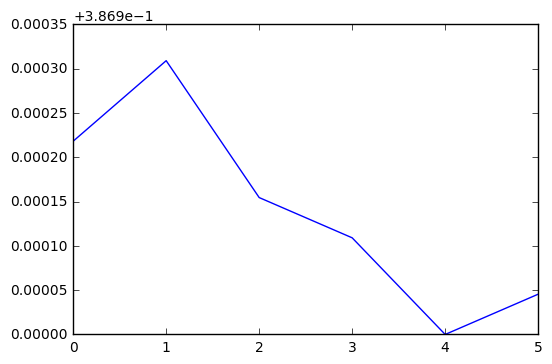

In [347]:
plt.plot(scores)

In [343]:
t = np.argmax(np.array(scores))
params[t]

(0.75, 100)

In [348]:
res = nonzero_mode(alldata, 200)
t = calc_visits(alldata, 0.75)
res[t==0] = 0

In [349]:
submit(res, "./7days_fit.csv")

### auc for zeros

In [363]:
from sklearn.metrics import roc_curve

In [364]:
def calc_visits_prob(x):
    res = (convolve2d(x, np.array([[1,1,1,1,1,1,1]]), 'valid') > 0).astype(float)
    weights = np.arange(res.shape[1]).astype(float)
    weights /= np.sum(weights)
    return np.sum(res * weights[None,:], axis=1)

In [367]:
def calc_visits_exp_prob(x, scale):
    res = (convolve2d(x, np.array([[1,1,1,1,1,1,1]]), 'valid') > 0).astype(float)
    weights = np.exp((np.arange(res.shape[1])-res.shape[1])/float(scale))
    weights /= np.sum(weights)
    return np.sum(res * weights[None,:], axis=1)

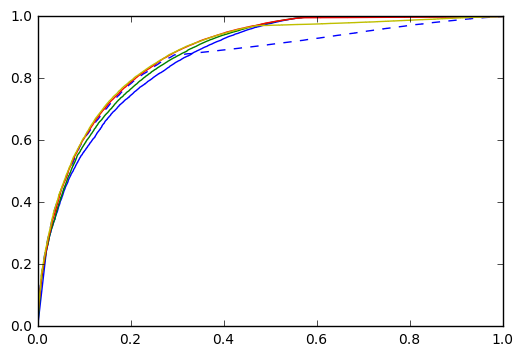

In [368]:
res = calc_visits_prob(train)
fpr, tpr, _ = roc_curve(gnd>0, res)
plt.plot(fpr, tpr, 'b--')
for scale,col in zip([10,20,50,100],['b-','g-','r-','y-']):
    res = calc_visits_exp_prob(train, scale)
    fpr, tpr, _ = roc_curve(gnd>0, res)
    plt.plot(fpr, tpr, col)
plt.show()

### density estimation

In [546]:
trainBin = [(train==i).astype(int) for i in range(17)]

In [381]:
subs = subs[:50]

In [378]:
def density(x, dim):
    return convolve2d(x, np.ones((1,dim))/dim, 'valid')

In [559]:
tmp = [density(t[subs,:], 7) for t in trainBin]

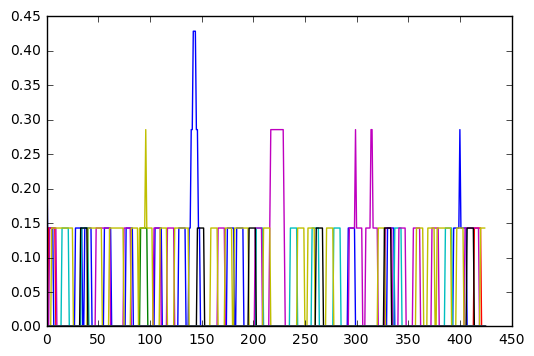

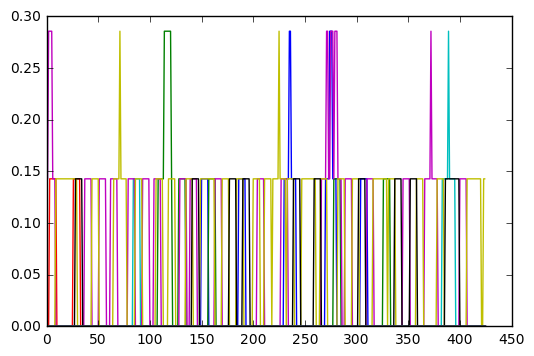

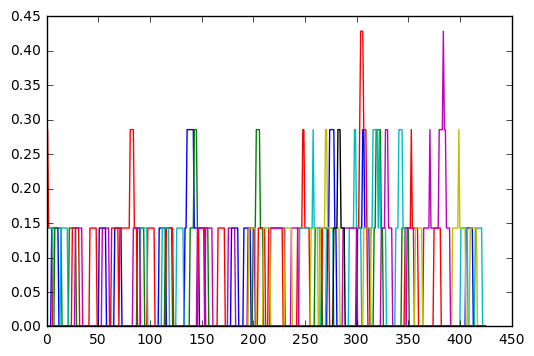

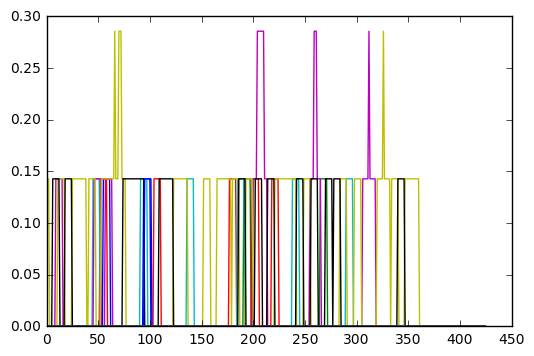

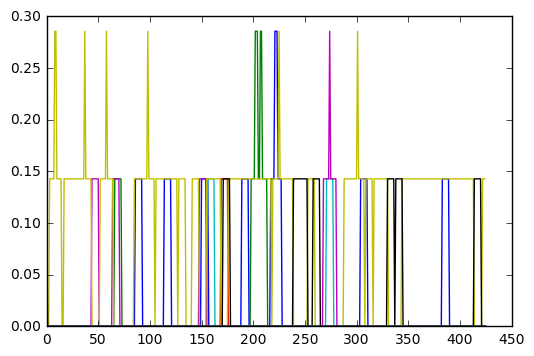

...

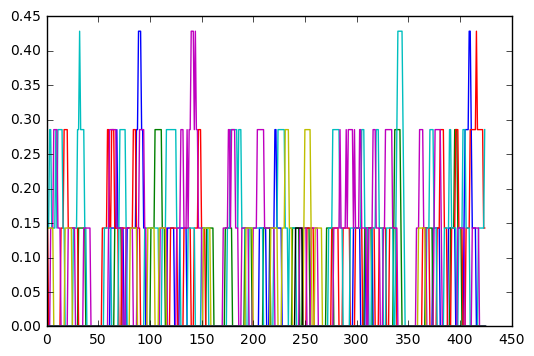

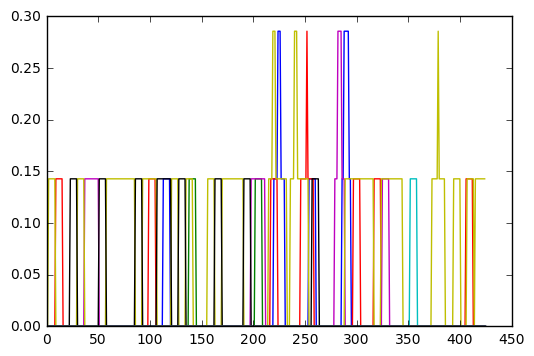

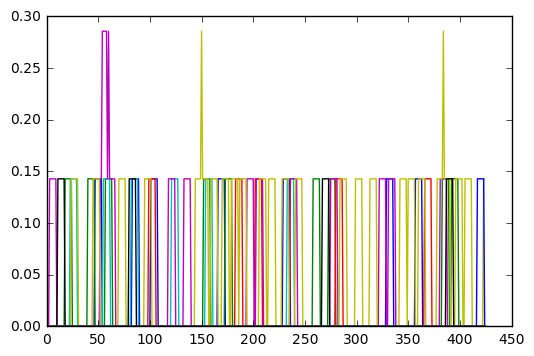

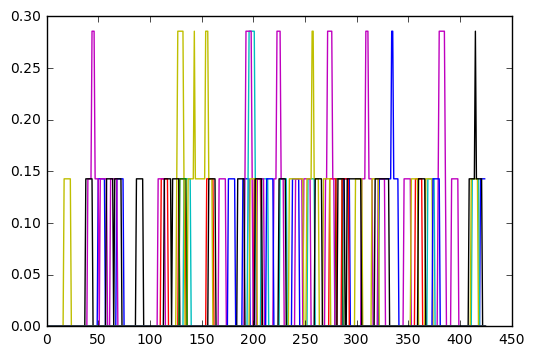

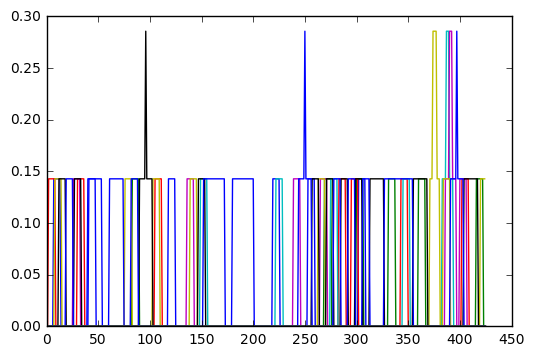

In [560]:
for i in range(subs.size):
    for j in range(1,17):
        plt.plot(tmp[j][i])
    plt.savefig("./dens/"+str(i)+".png")
    plt.show()

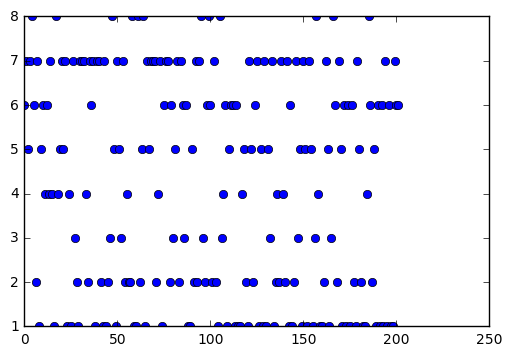

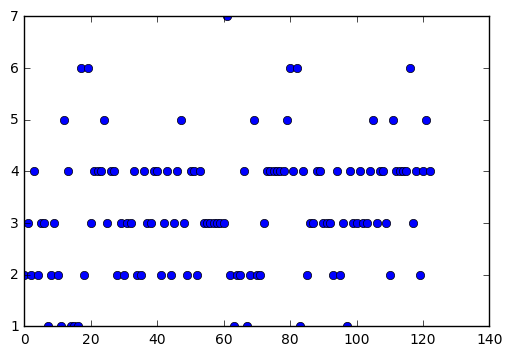

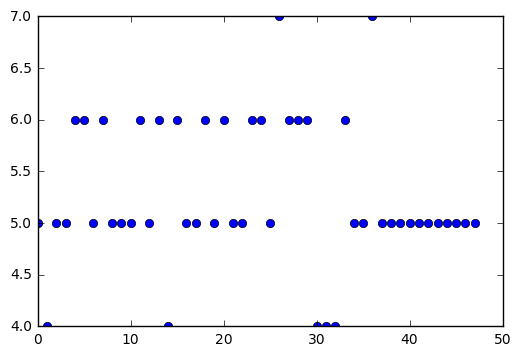

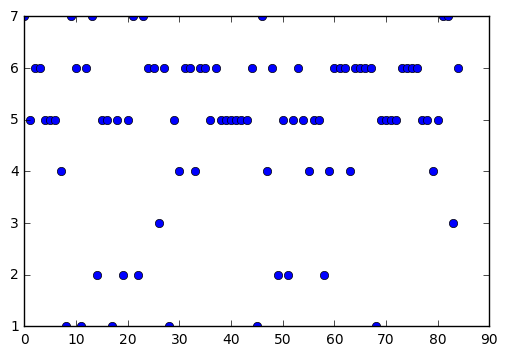

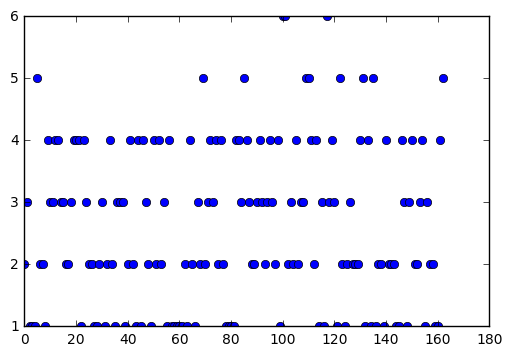

...

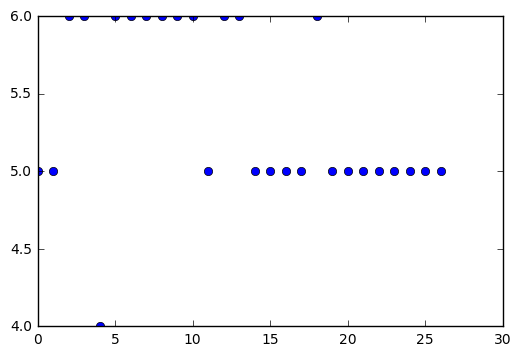

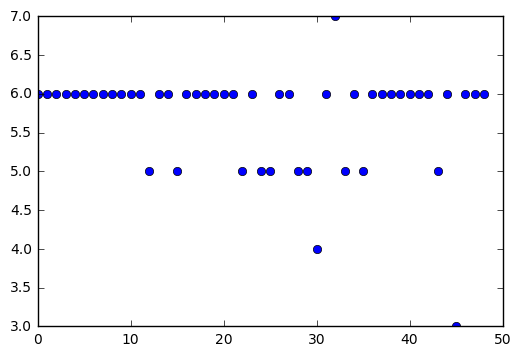

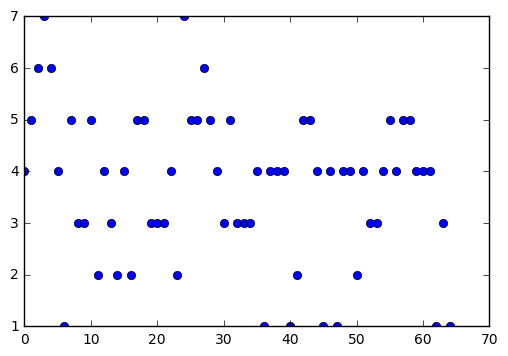

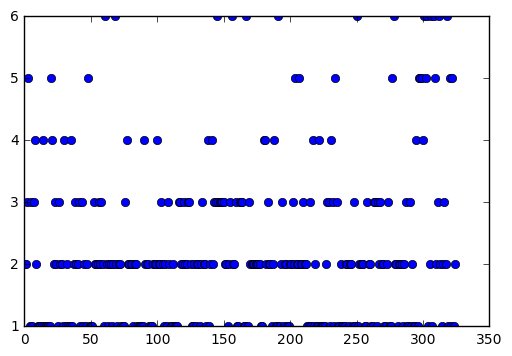

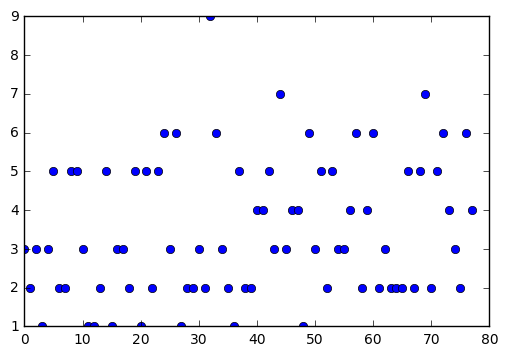

In [388]:
for i in range(subs.size):
    t = alldata[i][alldata[i]>0]
    plt.plot(t,"bo")
    plt.savefig("./clear/"+str(i)+".png")
    plt.show()

### gaussian

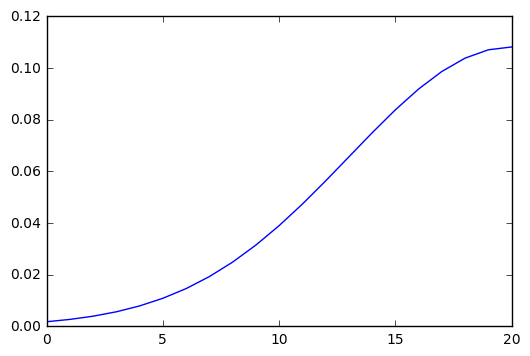

In [414]:
size = 21
ker = np.array([np.exp(-(i-size+1)**2/2/(size/3.0)**2)/np.sqrt(2*np.pi)/(size/3.0) for i in range(size)])
ker/=np.sum(ker)
plt.plot(ker)

In [552]:
def half_gaussian(x, size):
    ker = np.array([np.exp(-(i-size+1)**2/2/(size/3.0)**2)/np.sqrt(2*np.pi)/(size/3.0) for i in range(size)])
    ker/=np.sum(ker)
    return convolve2d(x, ker[None,:], 'valid')

In [557]:
tmp = [half_gaussian(t, 21) for t in trainBin]

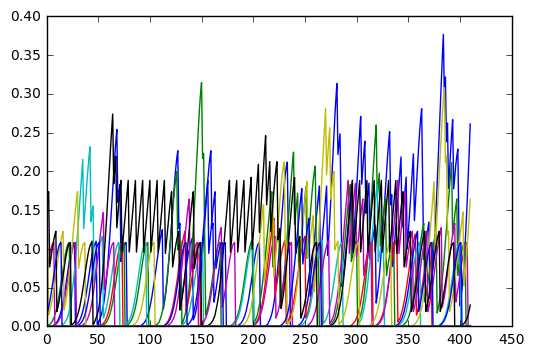

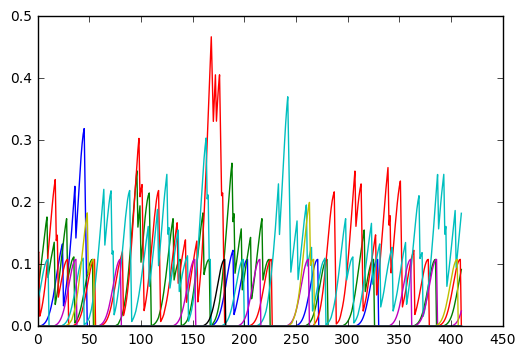

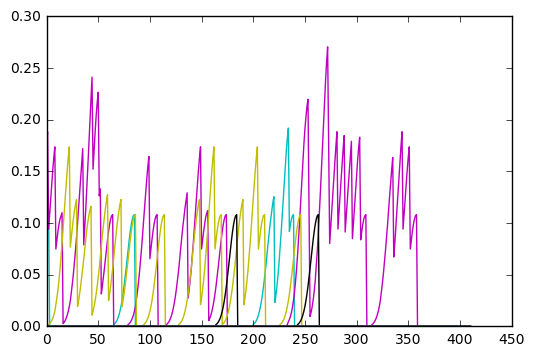

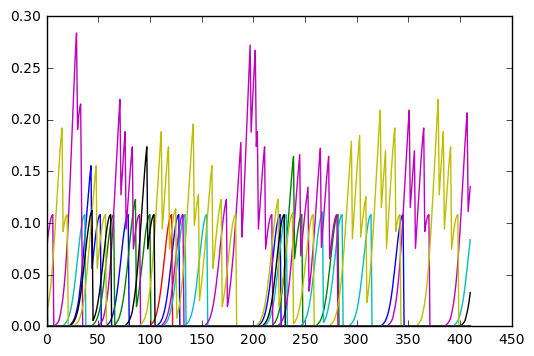

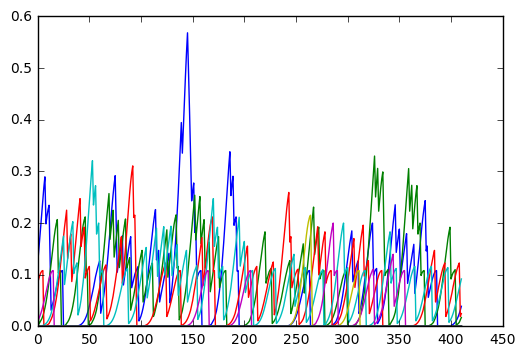

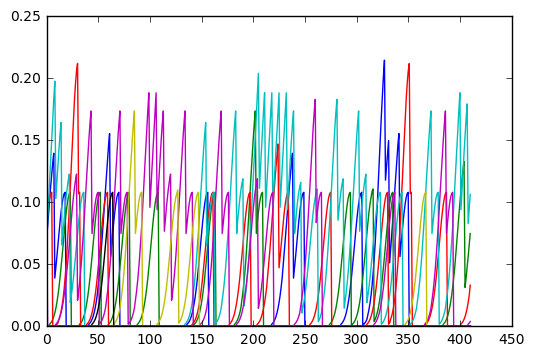

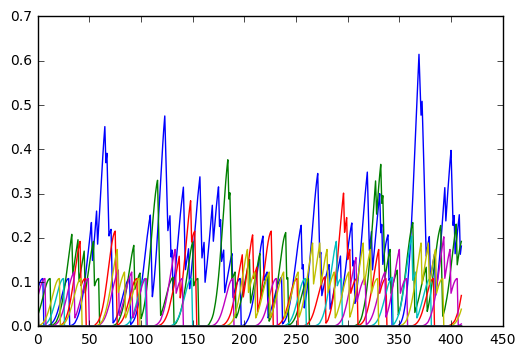

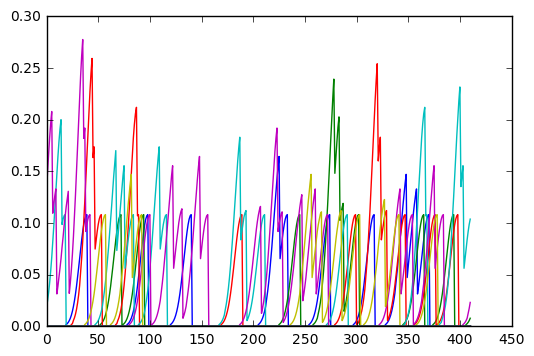

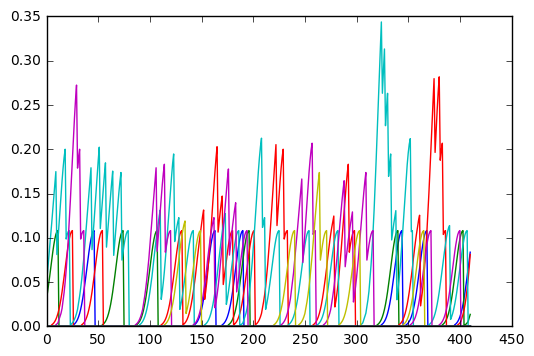

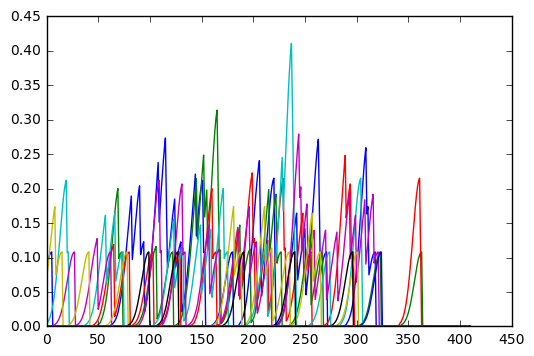

In [558]:
for i in range(10):
    for j in range(1,17):
        plt.plot(tmp[j][i])
    plt.savefig("./dens/"+str(i)+".png")
    plt.show()

In [442]:
res = np.argmax(np.hstack(tmp)[:,1:], axis=1)+1
t = calc_visits(train, 0.75)
res[t==0] = 0

In [443]:
find_score(res, gnd)

0.35804545454545456

In [448]:
scores = []
params = []
for th in [0.6,0.7,0.8,0.9]:
    t = calc_visits(train, th)
    for size in [157,177,197,217,237]:
        tmp = [half_gaussian(t, size) for t in trainBin]
        res = np.argmax(np.hstack(tmp)[:,1:], axis=1)+1
        res[t==0] = 0
        sc = find_score(res, gnd)
        print(th,size,sc)
        scores.append(sc)
        params.append((th,size))

0.6 157 0.291972727273
0.6 177 0.292245454545
0.6 197 0.292090909091
0.6 217 0.292281818182
0.6 237 0.292263636364
0.7 157 0.337963636364
0.7 177 0.338363636364
0.7 197 0.338281818182
0.7 217 0.338454545455
0.7 237 0.338818181818
0.8 157 0.372354545455
0.8 177 0.373254545455
0.8 197 0.373336363636
0.8 217 0.373772727273
0.8 237 0.373727272727
0.9 157 0.352290909091
0.9 177 0.353090909091
0.9 197 0.353263636364
0.9 217 0.353536363636
0.9 237 0.353381818182


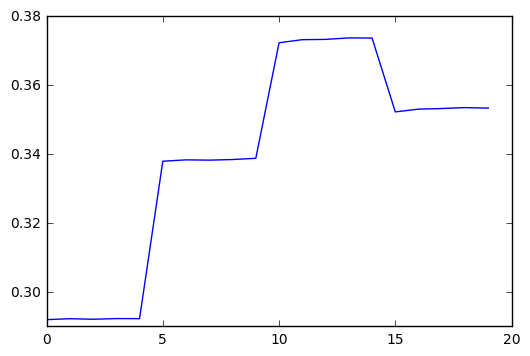

In [449]:
plt.plot(scores)

In [451]:
t = np.array([1,1,1,1,1,1,1,2,2,2,2,2,2,2,4,4,4,4,4,4,4])
t.reshape((3,7))

array([[1, 1, 1, 1, 1, 1, 1],
       [2, 2, 2, 2, 2, 2, 2],
       [4, 4, 4, 4, 4, 4, 4]])

In [455]:
train[:,4:].shape

(110000, 427)

In [458]:
trainM = train[:,4:]
trainM = [t.reshape((t.size//7,7)) for t in trainM]

In [462]:
visitsM = [(t>0).astype(int) for t in trainM]

In [487]:
probs = []
for gamma in [7, 8, 9, 10]:
    weights = np.arange(visitsM[0].shape[0], dtype=float)[:,None]
    weights = weights**gamma
    weights /= np.sum(weights)
    probs.append( np.array([1-np.prod(1-np.sum(t*weights,axis=0)) for t in visitsM]) )

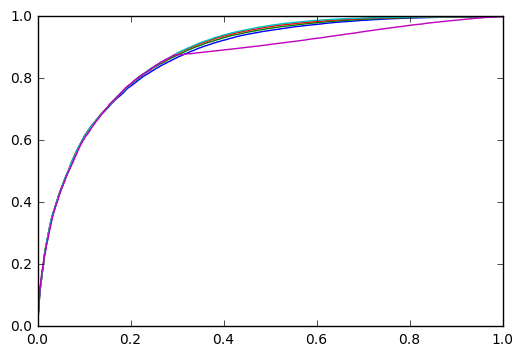

In [488]:
for p in probs:
    fpr,tpr,_ = roc_curve(gnd>0, p)
    plt.plot(fpr,tpr)
res = calc_visits_prob(train)
fpr1, tpr1,_ = roc_curve(gnd>0, res)
plt.plot(fpr1,tpr1)
plt.show()

In [491]:
def calc_visits_gamma_prob(x, gamma):
    res = (convolve2d(x, np.array([[1,1,1,1,1,1,1]]), 'valid') > 0).astype(float)
    weights = np.arange(res.shape[1]).astype(float)
    weights = weights**gamma
    weights /= np.sum(weights)
    return np.sum(res * weights[None,:], axis=1)

In [494]:
def calc_visits_byday(visits,gamma):
    weights = np.arange(visits[0].shape[0], dtype=float)[:,None]
    weights = weights**gamma
    weights /= np.sum(weights)
    return np.array([1-np.prod(1-np.sum(t*weights,axis=0)) for t in visits])

In [499]:
from sklearn.metrics import roc_auc_score

In [502]:
prob1 = calc_visits_gamma_prob(train, 10)
prob2 = calc_visits_byday(visitsM, 10)
alpha = np.array([0.4,0.45,0.5,0.55,0.6])
res = [roc_auc_score(gnd>0, a*prob1 + (1-a)*prob2)for a in alpha]

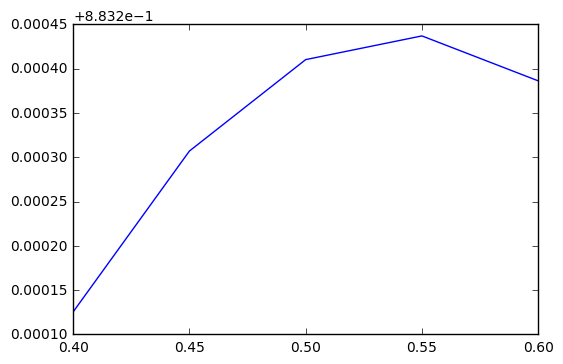

In [503]:
plt.plot(alpha,res)

In [505]:
prob1 = calc_visits_gamma_prob(train, 10)
prob2 = calc_visits_byday(visitsM, 10)
prob = 0.55*prob1 + (1-0.55)*prob2

In [508]:
scores = []
params = []
for thresh in [0.65,0.7,0.75]:
    t = (prob>thresh).astype(int)
    for scale in [150,175,200,225,250,275]:
        res = nonzero_mode(train, scale)
        res[t==0] = 0
        sc = find_score(res,gnd)
        scores.append(sc)
        params.append((thresh, scale))
        print (thresh,scale,sc)

0.65 150 0.384627272727
0.65 175 0.385290909091
0.65 200 0.385772727273
0.65 225 0.385918181818
0.65 250 0.385609090909
0.65 275 0.385590909091
0.7 150 0.386745454545
0.7 175 0.3874
0.7 200 0.387845454545
0.7 225 0.387963636364
0.7 250 0.387718181818
0.7 275 0.387590909091
0.75 150 0.3868
0.75 175 0.3874
0.75 200 0.387836363636
0.75 225 0.3879
0.75 250 0.387690909091
0.75 275 0.387581818182


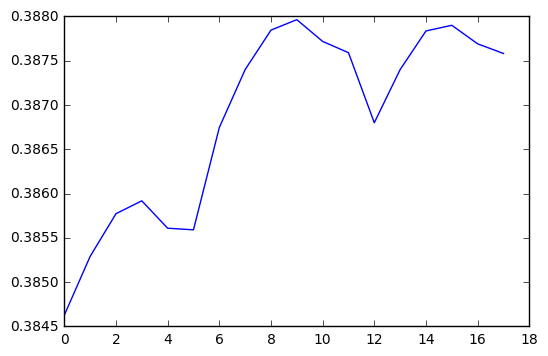

In [509]:
plt.plot(scores)

In [510]:
params[np.argmax(np.array(scores))]

(0.7, 225)

In [511]:
alldataM = alldata[:,4:]
alldataM = [t.reshape((t.size//7,7)) for t in alldataM]
allvisitsM = [(t>0).astype(int) for t in alldataM]

In [514]:
prob1 = calc_visits_gamma_prob(alldata, 10)
prob2 = calc_visits_byday(allvisitsM, 10)
prob = 0.55*prob1 + (1-0.55)*prob2

In [515]:
t = (prob>0.7).astype(int)
res = nonzero_mode(train, 225)
res[t==0] = 0

In [517]:
submit(res,"./compose.csv")

### Probs multiplication

In [600]:
prob1 = calc_visits_gamma_prob(train, 10)
prob2 = calc_visits_byday(visitsM, 10)
prob = 0.55*prob1 + (1-0.55)*prob2

In [538]:
def nonzero_mode_prob(x, scale=50):
    weights = np.exp((np.arange(x.shape[1])-x.shape[1])/float(scale))
    weights/=np.sum(weights)
    res = np.array([weight_mode(x[i], weights) for i in range(x.shape[0])])
    return res

In [539]:
vprob = nonzero_mode_prob(train, 225)

In [540]:
mprob = vprob*prob[:,None]

### first visits

In [608]:
def first_days(x, gamma):
    res = []
    for i in range(x.shape[0]):
        t = x[i,4:]
        t = t.reshape(t.size//7,7)
        t = t[np.sum(t,axis=1)>0]
        t = t[np.arange(t.shape[0]),np.argmax(t>0, axis=1)]
        w = np.arange(t.size, dtype=float)**gamma
        w /= np.sum(w)
        res.append( np.argmax(np.array([np.sum(w[t==i]) for i in range(1,17)]))+1 )
    return np.array(res)

In [599]:
res

array([6, 4, 5, ..., 3, 5, 6], dtype=int64)

In [634]:
prob1 = calc_visits_gamma_prob(train, 10)
prob2 = calc_visits_byday(visitsM, 10)
prob = 0.55*prob1 + (1-0.55)*prob2

In [611]:
scores = []
params = []
for gamma in [0.5,1,2,3,4,5,7,10]:
    res = first_days(train,gamma)
    for th in [0.5,0.55,0.6,0.65,0.7,0.75,0.8,0.85,0.9]:
        ans = res.copy()
        ans[prob<th] = 0
        sc = find_score(gnd,ans)
        scores.append(sc)
        params.append((gamma,th))
        print(gamma,th,sc)

0.5 0.5 0.374227272727
0.5 0.55 0.379572727273
0.5 0.6 0.383781818182
0.5 0.65 0.387645454545
0.5 0.7 0.389863636364
0.5 0.75 0.389918181818
0.5 0.8 0.386872727273
0.5 0.85 0.379727272727
0.5 0.9 0.362272727273
1 0.5 0.374936363636
1 0.55 0.380245454545
1 0.6 0.384563636364
1 0.65 0.388327272727
1 0.7 0.3904
1 0.75 0.3905
1 0.8 0.387490909091
1 0.85 0.380263636364
1 0.9 0.362863636364
2 0.5 0.374036363636
2 0.55 0.379409090909
2 0.6 0.383681818182
2 0.65 0.387309090909
2 0.7 0.389445454545
2 0.75 0.389627272727
2 0.8 0.386736363636
2 0.85 0.379336363636
2 0.9 0.362081818182
3 0.5 0.372427272727
3 0.55 0.377781818182
3 0.6 0.382081818182
3 0.65 0.385909090909
3 0.7 0.388081818182
3 0.75 0.388363636364
3 0.8 0.385572727273
3 0.85 0.3784
3 0.9 0.361536363636
4 0.5 0.369763636364
4 0.55 0.375236363636
4 0.6 0.379572727273
4 0.65 0.383463636364
4 0.7 0.385654545455
4 0.75 0.386081818182
4 0.8 0.383454545455
4 0.85 0.376463636364
4 0.9 0.359881818182
5 0.5 0.367627272727
5 0.55 0.3731
5 0.6 

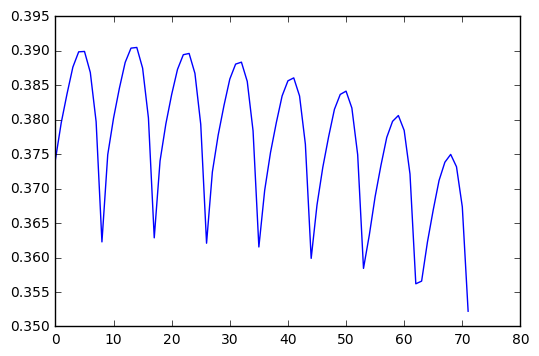

In [612]:
plt.plot(scores)

In [613]:
res = first_days(train,0)

In [614]:
for th in [0.5,0.55,0.6,0.65,0.7,0.75,0.8,0.85,0.9]:
    ans = res.copy()
    ans[prob<th] = 0
    print( find_score(gnd,ans))

0.371736363636
0.377090909091
0.381381818182
0.385190909091
0.387536363636
0.387763636364
0.384854545455
0.377854545455
0.360636363636


In [615]:
res = first_days(alldata,1)

In [616]:
res[prob<0.75] = 0

In [617]:
submit(res,"./first_days.csv")

In [618]:
prob1 = calc_visits_gamma_prob(alldata, 10)
prob2 = calc_visits_byday(allvisitsM, 10)
allprob = 0.55*prob1 + (1-0.55)*prob2

In [619]:
res = first_days(alldata,1)
res[allprob<0.75] = 0
submit(res,"./first_days_corrected.csv")

### prob multiplied

In [696]:
def first_days_prob(x, gamma):
    res = []
    for i in range(x.shape[0]):
        t = x[i,4:]
        t = t.reshape(t.size//7,7)
        t = t[np.sum(t,axis=1)>0]
        t = t[np.arange(t.shape[0]),np.argmax(t>0, axis=1)]
        w = np.arange(t.size, dtype=float)**gamma
        w /= np.sum(w)
        res.append( np.array([np.sum(w[t==i]) for i in range(1,17)]) )
    res = np.array(res)
    return np.argmax(res, axis=1)+1, res 

In [633]:
res, resprob = first_days_prob(train, 1)

In [641]:
scores = []
params = []
for a in [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]:
    p = prob*(a*resprob+1-a)
    for th in [0.1, 0.15, 0.2,0.25, 0.3,0.35, 0.4,0.45, 0.5,0.55, 0.6,0.65, 0.7,0.75, 0.8,0.85, 0.9]:
        ans = res.copy()
        ans[p<th] = 0
        sc = find_score(gnd, ans)
        scores.append(sc)
        params.append((a, th))
        print(a,th,sc)
scores=np.array(scores)

0 0.1 0.266536363636
0 0.15 0.2835
0 0.2 0.311572727273
0 0.25 0.335109090909
0 0.3 0.351263636364
0 0.35 0.360327272727
0 0.4 0.366145454545
0 0.45 0.370018181818
0 0.5 0.374936363636
0 0.55 0.380245454545
0 0.6 0.384563636364
0 0.65 0.388327272727
0 0.7 0.3904
0 0.75 0.3905
0 0.8 0.387490909091
0 0.85 0.380263636364
0 0.9 0.362863636364
0.1 0.1 0.268072727273
0.1 0.15 0.288054545455
0.1 0.2 0.318581818182
0.1 0.25 0.341190909091
0.1 0.3 0.355681818182
0.1 0.35 0.363227272727
0.1 0.4 0.368354545455
0.1 0.45 0.373054545455
0.1 0.5 0.378190909091
0.1 0.55 0.383436363636
0.1 0.6 0.388081818182
0.1 0.65 0.390827272727
0.1 0.7 0.391509090909
0.1 0.75 0.388654545455
0.1 0.8 0.3813
0.1 0.85 0.362945454545
0.1 0.9 0.324518181818
0.2 0.1 0.269881818182
0.2 0.15 0.294190909091
0.2 0.2 0.326245454545
0.2 0.25 0.347745454545
0.2 0.3 0.359227272727
0.2 0.35 0.365963636364
0.2 0.4 0.3708
0.2 0.45 0.376281818182
0.2 0.5 0.382290909091
0.2 0.55 0.387427272727
0.2 0.6 0.391054545455
0.2 0.65 0.3922363

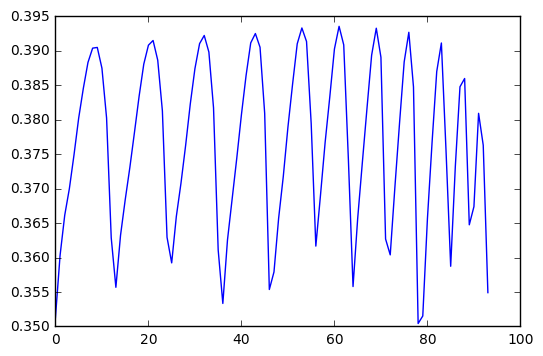

In [642]:
plt.plot(scores[scores>0.35])

In [640]:
params[np.argmax(np.array(scores))]

(0.5, 0.5)

In [643]:
res, resprob = first_days_prob(alldata, 1)

In [644]:
p = allprob*(0.5*resprob+1-0.5)

In [645]:
res[p<0.5] = 0

In [647]:
submit(res,"./prob_mult.csv")

### Matching weeks

In [701]:
def match_weeks_prob(x, n=1, gamma=1):
    res = []
    for t in x:
        t = t[4:]
        comp = t[-n*7:]
        t = t.reshape((t.size//7,7))
        t = t[np.sum(t,axis=1)>0]
        wgt = np.hstack([t[i:t.shape[0]-n+i] for i in range(n)])
        days = t[n:]
        wgt = np.sum(wgt==comp, axis=1).astype(float)**gamma
        wgt /= np.sum(wgt)
        days = days[np.arange(days.shape[0]),np.argmax(days>0, axis=1)]
        res.append(np.array([np.sum(wgt[days==i]) for i in range(1,17)]))
    res=np.array(res)
    return np.argmax(res, axis=1)+1, res

In [689]:
scores = []
params = []
for n in [1,]:
    for gamma in [0, 0.25, 0.5, 1]:
        res,_ = match_weeks_prob(train,n,gamma)
        for th in [0.3,0.35, 0.4,0.45, 0.5,0.55, 0.6,0.65, 0.7,0.75, 0.8,0.85, 0.9]:
            ans = res.copy()
            ans[prob<th] = 0
            sc = find_score(gnd,ans)
            scores.append(sc)
            params.append((n,gamma,th))
            print(n,gamma,th,sc)
scores = np.array(scores)

1 0 0.3 0.347554545455
1 0 0.35 0.356609090909
1 0 0.4 0.362518181818
1 0 0.45 0.366436363636
1 0 0.5 0.371336363636
1 0 0.55 0.3767
1 0 0.6 0.381009090909
1 0 0.65 0.3848
1 0 0.7 0.387236363636
1 0 0.75 0.387527272727
1 0 0.8 0.384590909091
1 0 0.85 0.377527272727
1 0 0.9 0.360354545455
1 0.25 0.3 0.348581818182
1 0.25 0.35 0.357636363636
1 0.25 0.4 0.363554545455
1 0.25 0.45 0.3675
1 0.25 0.5 0.372345454545
1 0.25 0.55 0.377681818182
1 0.25 0.6 0.381945454545
1 0.25 0.65 0.385718181818
1 0.25 0.7 0.388045454545
1 0.25 0.75 0.3883
1 0.25 0.8 0.385381818182
1 0.25 0.85 0.378127272727
1 0.25 0.9 0.360863636364
1 0.5 0.3 0.348863636364
1 0.5 0.35 0.357909090909
1 0.5 0.4 0.363818181818
1 0.5 0.45 0.367763636364
1 0.5 0.5 0.372618181818
1 0.5 0.55 0.377954545455
1 0.5 0.6 0.382209090909
1 0.5 0.65 0.385981818182
1 0.5 0.7 0.388336363636
1 0.5 0.75 0.388527272727
1 0.5 0.8 0.385636363636
1 0.5 0.85 0.378290909091
1 0.5 0.9 0.361
1 1 0.3 0.348581818182
1 1 0.35 0.357627272727
1 1 0.4 0.3635

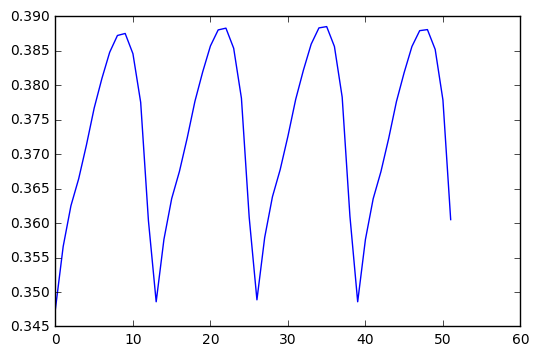

In [690]:
plt.plot(scores)

In [691]:
params[np.argmax(scores)]

(1, 0.5, 0.75)

In [692]:
prob1 = calc_visits_gamma_prob(train, 10)
prob2 = calc_visits_byday(visitsM, 10)

In [702]:
res1, resprob1 = first_days_prob(train, 1)
res2, resprob2 = match_weeks_prob(train, 1, 0.5)

In [704]:
resprob1.shape

(110000, 16)

In [726]:
scores = []
params = []
mixlist = [0,0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,0.5,0.55,0.6,0.65,0.7,0.75,0.8,0.85,0.9,0.95,1]
for a in mixlist:
    p = a*prob1+(1-a)*prob2
    print(a)
    for b in mixlist:
        rp = b*resprob1+(1-b)*resprob2
        res, rp = np.argmax(rp, axis=1)+1, np.max(rp, axis=1)
        for c in mixlist:
            t = p*(c*rp+1-c)
            for th in [0.3,0.35,0.4,0.45,0.5,0.55,0.6,0.65,0.7,0.75,0.8,0.85,0.9]:
                ans = res.copy()
                ans[t<th] = 0
                scores.append(find_score(gnd, ans))
                params.append((a,b,c,th))
scores = np.array(scores)

0
0.05
0.1
0.15
0.2
0.25
0.3
0.35
0.4
0.45
0.5
0.55
0.6
0.65
0.7
0.75
0.8
0.85
0.9
0.95
1


In [727]:
params[np.argmax(scores)]

(0.45, 0.8, 0.5, 0.5)

In [728]:
prob1 = calc_visits_gamma_prob(alldata, 10)
prob2 = calc_visits_byday(allvisitsM, 10)
res1, resprob1 = first_days_prob(alldata, 1)
res2, resprob2 = match_weeks_prob(alldata, 1, 0.5)
p = 0.45*prob1+(1-0.45)*prob2
rp = 0.8*resprob1+(1-0.8)*resprob2
res, rp = np.argmax(rp, axis=1)+1, np.max(rp, axis=1)
t = p*(0.5*rp+1-0.5)
ans = res.copy()
ans[t<0.5] = 0

In [729]:
submit(ans,"./triple_kill.csv")